In [1]:
%matplotlib inline
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
import matplotlib.pyplot as plt
import torchvision.utils
import numpy as np
import random
from PIL import Image
import torch
from torch.autograd import Variable
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F

In [2]:
import kagglehub

vggface2_path = kagglehub.dataset_download('hearfool/vggface2')
print(vggface2_path)

100%|██████████| 2.32G/2.32G [00:19<00:00, 128MB/s]

Extracting files...


/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1


In [3]:
def imshow(img,text=None,should_save=False):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [4]:
import os
class Config():
    # مسیر اصلی دیتاست VGGFace2
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"

    # مسیر داده‌های آموزشی و آزمایشی
    training_dir = os.path.join(base_dir, "train")
    testing_dir = os.path.join(base_dir, "val")

    # تنظیمات آموزش
    train_batch_size = 64
    train_number_epochs = 500
    train_subset_size = 500  # Subset size for training
    val_subset_size = 500    # Subset size for validation


In [ ]:
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

In [ ]:
from torch.utils.data import DataLoader, Dataset, Subset
import random
import os
folder_dataset_train = dset.ImageFolder(root=Config.training_dir)
train_subset_indices = random.sample(range(len(folder_dataset_train.imgs)), Config.train_subset_size)
train_subset_paths = [folder_dataset_train.imgs[i] for i in train_subset_indices]

In [ ]:
siamese_dataset_train = SiameseNetworkDataset(
    image_paths=train_subset_paths,
    transform=transforms.Compose([transforms.Resize((100, 100)), transforms.ToTensor()]),
    should_invert=False
)

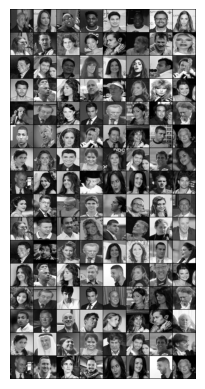

[[1.]
 [1.]
 [0.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [0.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [0.]
 [1.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [1.]]


In [ ]:
train_dataloader = DataLoader(
    siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size
)

dataiter = iter(train_dataloader)


example_batch = next(dataiter)
concatenated = torch.cat((example_batch[0],example_batch[1]),0)
imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy())

In [ ]:
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(1, 4, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(4),

            nn.ReflectionPad2d(1),
            nn.Conv2d(4, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


            nn.ReflectionPad2d(1),
            nn.Conv2d(8, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


        )

        self.fc1 = nn.Sequential(
            nn.Linear(8*100*100, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 5))

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

In [ ]:
class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """

    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)
        loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))


        return loss_contrastive

In [ ]:
net = SiameseNetwork().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(),lr = 0.0005 )

In [ ]:
counter = []
loss_history = []
iteration_number= 0

In [ ]:
for epoch in range(Config.train_number_epochs):
    for i, data in enumerate(train_dataloader, 0):
        img0, img1, label = data
        img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
        optimizer.zero_grad()
        output1, output2 = net(img0, img1)
        loss_contrastive = criterion(output1, output2, label)
        loss_contrastive.backward()
        optimizer.step()
        if i % 10 == 0:
            print(f"Epoch {epoch}, Loss: {loss_contrastive.item()}")



Epoch 0, Loss: 1.6543760299682617
Epoch 1, Loss: 27.778955459594727
Epoch 2, Loss: 68.27135467529297
Epoch 3, Loss: 1.2479519844055176
Epoch 4, Loss: 2.3415350914001465
Epoch 5, Loss: 4.338860034942627
Epoch 6, Loss: 1.7550373077392578
Epoch 7, Loss: 0.7966699004173279
Epoch 8, Loss: 1.7052135467529297
Epoch 9, Loss: 1.0503268241882324
Epoch 10, Loss: 0.5950712561607361
Epoch 11, Loss: 0.7426429390907288
Epoch 12, Loss: 0.7179293632507324
Epoch 13, Loss: 2.2568774223327637
Epoch 14, Loss: 1.045306921005249
Epoch 15, Loss: 0.5190412998199463
Epoch 16, Loss: 1.87538743019104
Epoch 17, Loss: 1.0893514156341553
Epoch 18, Loss: 0.9635758399963379
Epoch 19, Loss: 2.991565704345703
Epoch 20, Loss: 0.6729438304901123
Epoch 21, Loss: 0.6904516220092773
Epoch 22, Loss: 0.8638747334480286
Epoch 23, Loss: 0.603573739528656
Epoch 24, Loss: 0.2892529368400574
Epoch 25, Loss: 0.8211665153503418
Epoch 26, Loss: 0.5788521766662598
Epoch 27, Loss: 1.1169991493225098
Epoch 28, Loss: 0.23076091706752777
E

#normal test

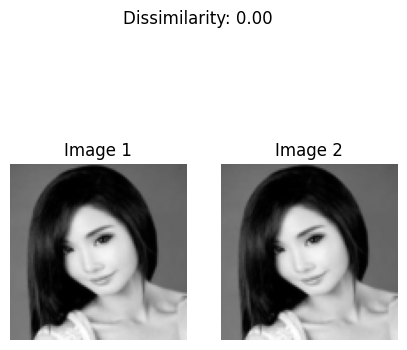

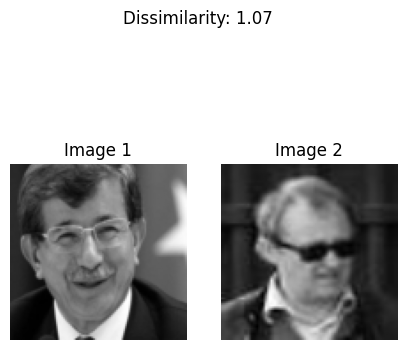

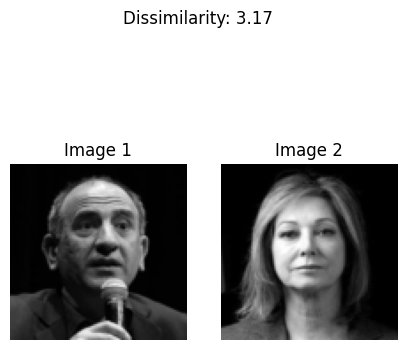

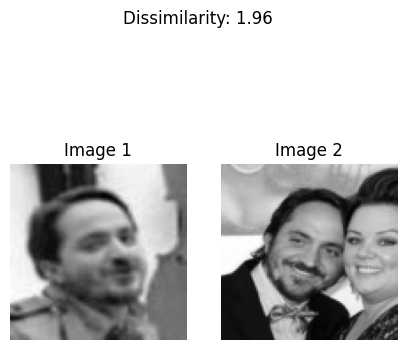

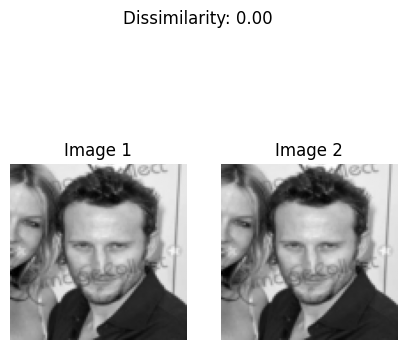

...

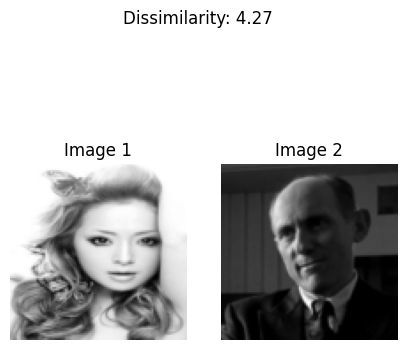

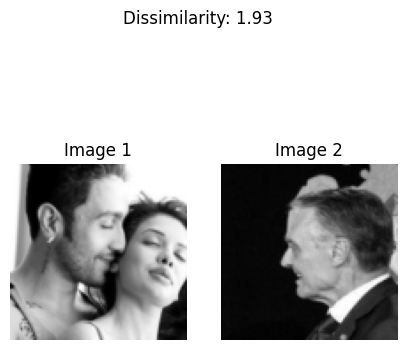

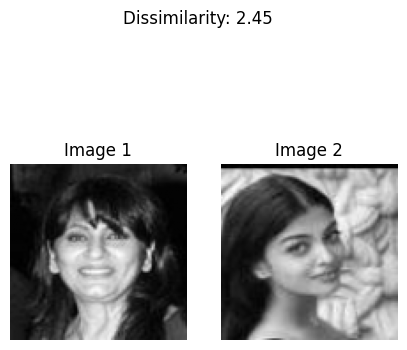

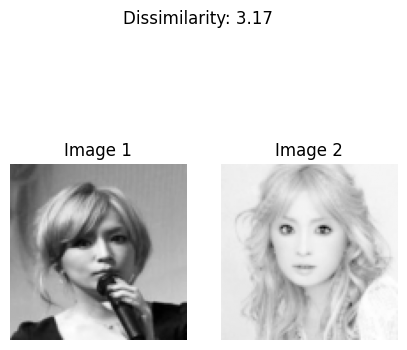

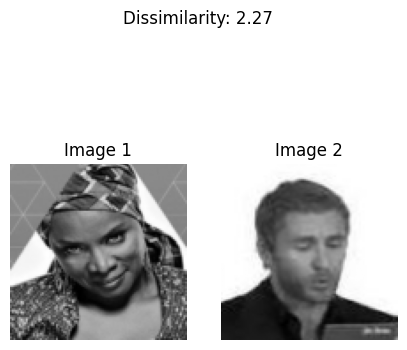

In [ ]:
folder_dataset_val = dset.ImageFolder(root=Config.testing_dir)
val_subset_indices = random.sample(range(len(folder_dataset_val.imgs)), Config.val_subset_size)
val_subset_paths = [folder_dataset_val.imgs[i] for i in val_subset_indices]

siamese_dataset_val = SiameseNetworkDataset(
    image_paths=val_subset_paths,
    transform=transforms.Compose([transforms.Resize((100, 100)), transforms.ToTensor()]),
    should_invert=False
)

val_dataloader = DataLoader(siamese_dataset_val, num_workers=4, batch_size=1, shuffle=True)

# Sample validation with plots
val_dataiter = iter(val_dataloader)
x0, _, _ = next(val_dataiter)
correct = 0
total = 0
for i, data in enumerate(val_dataloader):
    x0, x1, label = data
    output1, output2 = net(x0.cuda(), x1.cuda())
    euclidean_distance = F.pairwise_distance(output1, output2)
    prediction = (euclidean_distance > 1.0).float()  # Threshold can be adjusted

    # Accuracy calculation
    correct += (prediction.cpu() == label).sum().item()
    total += label.size(0)

    # Plot the images
    fig, axs = plt.subplots(1, 2, figsize=(5, 5))
    axs[0].imshow(x0.squeeze().cpu().numpy(), cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Image 1')

    axs[1].imshow(x1.squeeze().cpu().numpy(), cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Image 2')

    plt.suptitle(f'Dissimilarity: {euclidean_distance.item():.2f}')
    plt.show()

# Print overall accuracy
accuracy = correct / total * 100
print(f'Overall Accuracy: {accuracy:.2f}%')



#data augmentation 71%

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch 0, Loss: 1.039017677307129
Epoch 1, Loss: 5.044901371002197
Epoch 2, Loss: 1.864880919456482
Epoch 3, Loss: 1.4617809057235718
Epoch 4, Loss: 0.97861248254776
Epoch 5, Loss: 1.0600155591964722
Epoch 6, Loss: 0.8351863026618958
Epoch 7, Loss: 0.7521305084228516
Epoch 8, Loss: 0.9486793279647827
Epoch 9, Loss: 0.7838587760925293
Epoch 10, Loss: 0.5241619348526001
Epoch 11, Loss: 0.5675350427627563
Epoch 12, Loss: 0.7611308693885803
Epoch 13, Loss: 0.7479766607284546
Epoch 14, Loss: 0.5879161357879639
Epoch 15, Loss: 0.8493733406066895
Epoch 16, Loss: 0.7848873138427734
Epoch 17, Loss: 0.5139310359954834
Epoch 18, Loss: 0.5673229694366455
Epoch 19, Loss: 0.5121720433235168
Epoch 20, Loss: 0.5748634338378906
Epoch 21, Loss: 0.5288457870483398
Epoch 22, Loss: 0.6100419759750366
Epoch 23, Loss: 0.6857031583786011
Epoch 24, Loss: 0.658458411693573
Epoch 25, Loss: 0.5707415342330933
Epoch 26, Loss: 0.48464471101760864
Epoch 27, Loss: 0.7033841609954834
Epoch 28, Loss: 0.5655820965766907


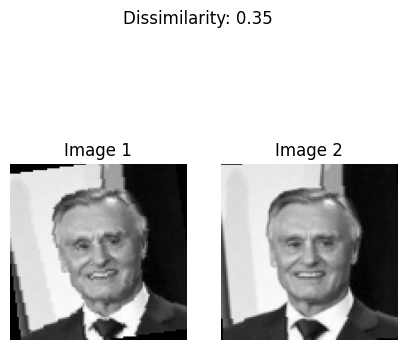

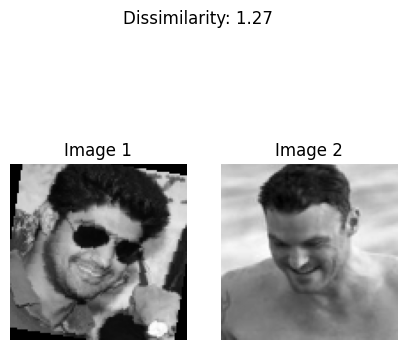

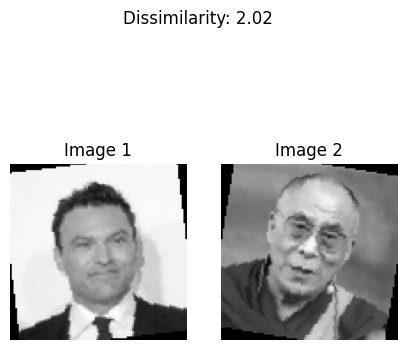

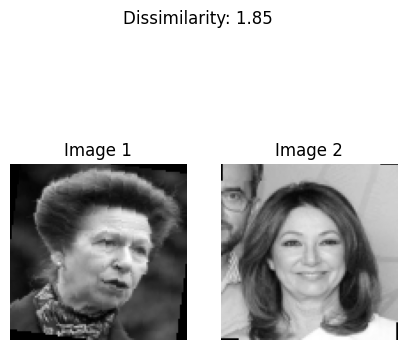

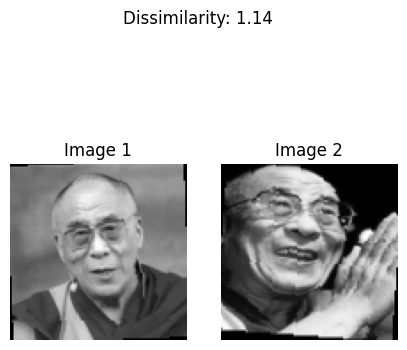

In [ ]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 100
    train_subset_size = 500  # Increased subset size for training
    val_subset_size = 100    # Subset size for validation


# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)


# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2


# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive


# Model training function
def train_model(net, train_loader, criterion, optimizer, epochs):
    for epoch in range(epochs):
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()

            if i % 10 == 0:
                print(f"Epoch {epoch}, Loss: {loss_contrastive.item()}")


# Model training
net = SiameseNetwork().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=0.0005)
train_model(net, train_dataloader, criterion, optimizer, Config.train_number_epochs)

# Validation with subset
siamese_dataset_val = load_dataset(Config.validation_dir, Config.val_subset_size)
val_dataloader = DataLoader(siamese_dataset_val, num_workers=4, batch_size=1, shuffle=True)

# Validation function
def validate_model(net, val_loader):
    correct, total = 0, 0
    for data in val_loader:
        x0, x1, label = data
        output1, output2 = net(x0.cuda(), x1.cuda())
        euclidean_distance = F.pairwise_distance(output1, output2)
        prediction = (euclidean_distance > 1.0).float()

        correct += (prediction.cpu() == label).sum().item()
        total += label.size(0)

        fig, axs = plt.subplots(1, 2, figsize=(5, 5))
        axs[0].imshow(x0.squeeze().cpu().numpy(), cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Image 1')

        axs[1].imshow(x1.squeeze().cpu().numpy(), cmap='gray')
        axs[1].axis('off')
        axs[1].set_title('Image 2')

        plt.suptitle(f'Dissimilarity: {euclidean_distance.item():.2f}')
        plt.show()

    accuracy = correct / total * 100
    print(f'Overall Accuracy: {accuracy:.2f}%')


# Run validation
validate_model(net, val_dataloader)


# increase epochs to 300 -> 59%

Epoch 0, Loss: 0.9708513617515564
Epoch 1, Loss: 11.91293716430664
Epoch 2, Loss: 4.427059650421143
Epoch 3, Loss: 1.8301050662994385
Epoch 4, Loss: 1.1410561800003052
Epoch 5, Loss: 0.926505446434021
Epoch 6, Loss: 1.044947624206543
Epoch 7, Loss: 0.9062542915344238
Epoch 8, Loss: 1.0374722480773926
Epoch 9, Loss: 0.6833529472351074
Epoch 10, Loss: 0.8181065917015076
Epoch 11, Loss: 0.7272847890853882
Epoch 12, Loss: 0.6850229501724243
Epoch 13, Loss: 0.8886184692382812
Epoch 14, Loss: 0.6936361193656921
Epoch 15, Loss: 0.8319177627563477
Epoch 16, Loss: 0.9477511644363403
Epoch 17, Loss: 0.6947689056396484
Epoch 18, Loss: 0.7751215696334839
Epoch 19, Loss: 0.8840363621711731
Epoch 20, Loss: 0.5839599370956421
Epoch 21, Loss: 0.7252252101898193
Epoch 22, Loss: 0.6619082689285278
Epoch 23, Loss: 0.5747483968734741
Epoch 24, Loss: 0.5820407867431641
Epoch 25, Loss: 0.5876900553703308
Epoch 26, Loss: 0.5005476474761963
Epoch 27, Loss: 0.7225736975669861
Epoch 28, Loss: 0.5566023588180542

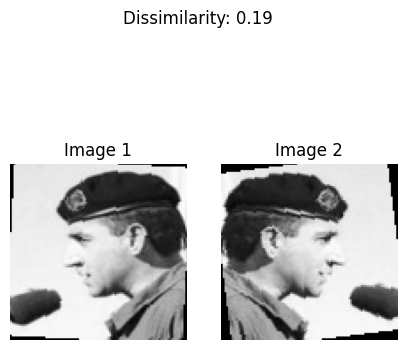

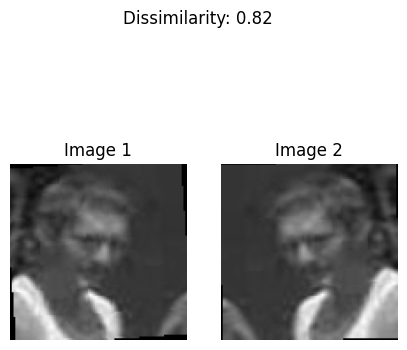

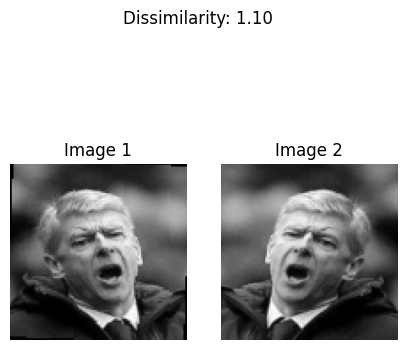

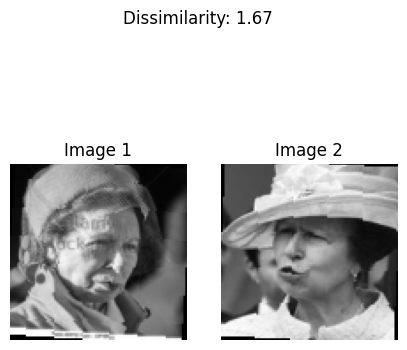

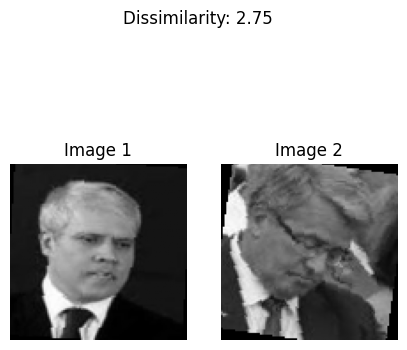

...

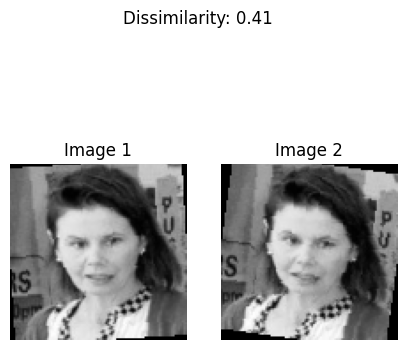

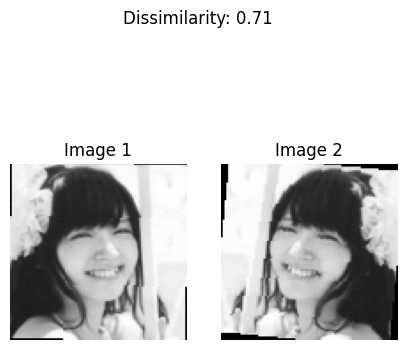

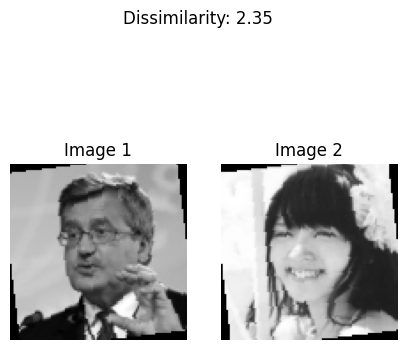

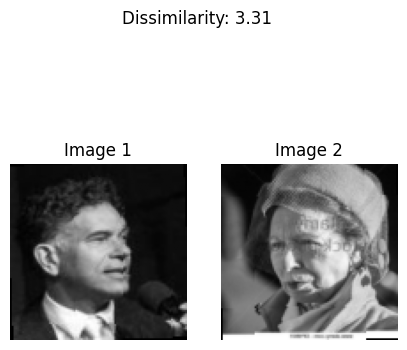

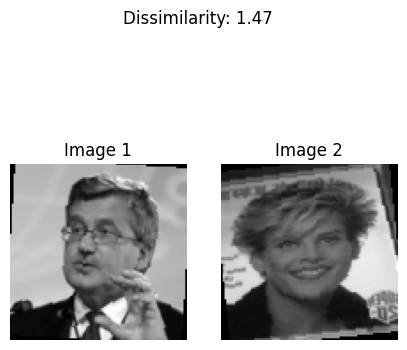

Overall Accuracy: 77.00%


In [ ]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 300
    train_subset_size = 500  # Increased subset size for training
    val_subset_size = 100    # Subset size for validation


# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)


# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2


# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive


# Model training function
def train_model(net, train_loader, criterion, optimizer, epochs):
    for epoch in range(epochs):
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()

            if i % 10 == 0:
                print(f"Epoch {epoch}, Loss: {loss_contrastive.item()}")


# Model training
net = SiameseNetwork().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=0.0005)
train_model(net, train_dataloader, criterion, optimizer, Config.train_number_epochs)

# Validation with subset
siamese_dataset_val = load_dataset(Config.validation_dir, Config.val_subset_size)
val_dataloader = DataLoader(siamese_dataset_val, num_workers=4, batch_size=1, shuffle=True)

# Validation function
def validate_model(net, val_loader):
    correct, total = 0, 0
    for data in val_loader:
        x0, x1, label = data
        output1, output2 = net(x0.cuda(), x1.cuda())
        euclidean_distance = F.pairwise_distance(output1, output2)
        prediction = (euclidean_distance > 1.0).float()

        correct += (prediction.cpu() == label).sum().item()
        total += label.size(0)

        fig, axs = plt.subplots(1, 2, figsize=(5, 5))
        axs[0].imshow(x0.squeeze().cpu().numpy(), cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Image 1')

        axs[1].imshow(x1.squeeze().cpu().numpy(), cmap='gray')
        axs[1].axis('off')
        axs[1].set_title('Image 2')

        plt.suptitle(f'Dissimilarity: {euclidean_distance.item():.2f}')
        plt.show()

    accuracy = correct / total * 100
    print(f'Overall Accuracy: {accuracy:.2f}%')


# Run validation
validate_model(net, val_dataloader)


#increase epochs to 150 - > 60%

Epoch 0, Average Loss: 4.6208
Epoch 1, Average Loss: 1.9787
Epoch 2, Average Loss: 2.8592
Epoch 3, Average Loss: 0.7733
Epoch 4, Average Loss: 1.8691
Epoch 5, Average Loss: 1.6525
Epoch 6, Average Loss: 1.0443
Epoch 7, Average Loss: 0.7240
Epoch 8, Average Loss: 1.0707
Epoch 9, Average Loss: 0.8131
Epoch 10, Average Loss: 0.4825
Epoch 11, Average Loss: 0.5905
Epoch 12, Average Loss: 0.4411
Epoch 13, Average Loss: 0.8947
Epoch 14, Average Loss: 1.3422
Epoch 15, Average Loss: 0.5301
Epoch 16, Average Loss: 0.6000
Epoch 17, Average Loss: 0.6111
Epoch 18, Average Loss: 0.8344
Epoch 19, Average Loss: 0.6503
Epoch 20, Average Loss: 0.4197
Epoch 21, Average Loss: 0.4802
Epoch 22, Average Loss: 0.8491
Epoch 23, Average Loss: 0.4994
Epoch 24, Average Loss: 0.3428
Epoch 25, Average Loss: 0.3367
Epoch 26, Average Loss: 0.3746
Epoch 27, Average Loss: 0.3658
Epoch 28, Average Loss: 0.2945
Epoch 29, Average Loss: 0.5905
Epoch 30, Average Loss: 0.3440
Epoch 31, Average Loss: 0.3814
Epoch 32, Average 

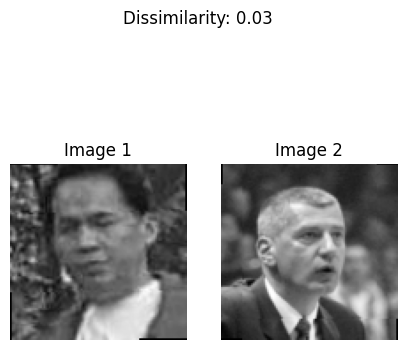

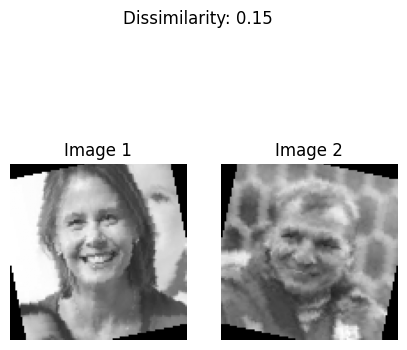

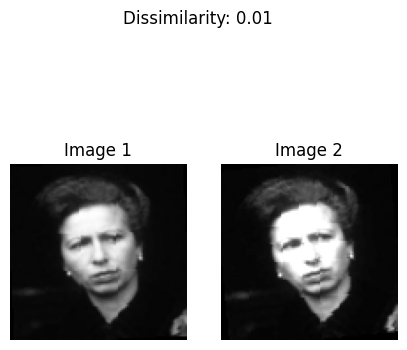

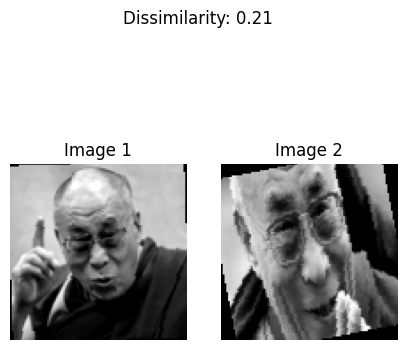

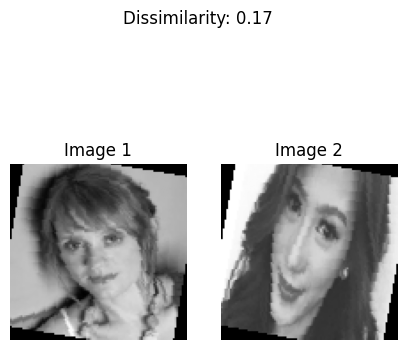

...

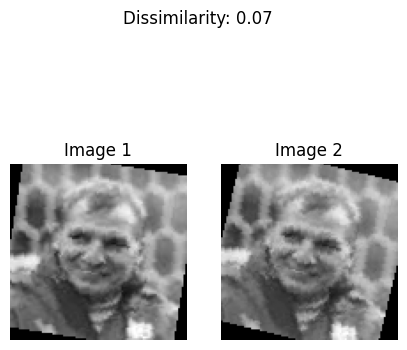

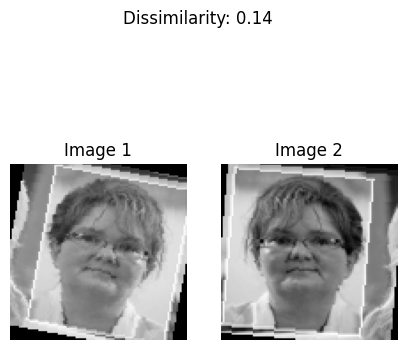

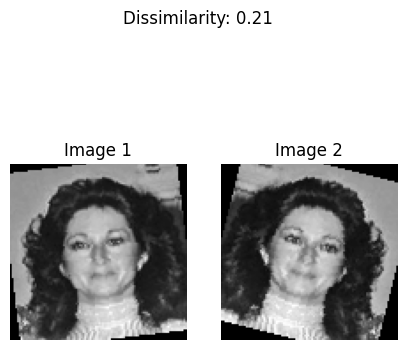

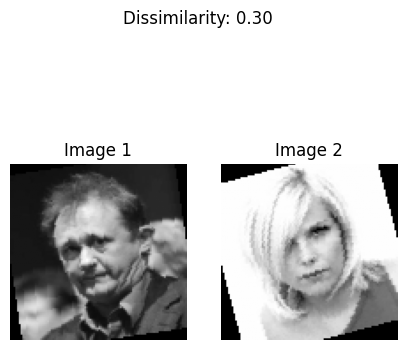

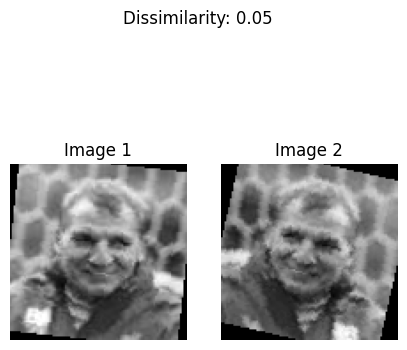

Overall Accuracy: 53.00%


In [6]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 150  # Increased epochs
    train_subset_size = 500
    val_subset_size = 100

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # Enhanced augmentation
    transforms.RandomRotation(15),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network with added dropout
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 16, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(16),
            nn.ReflectionPad2d(1), nn.Conv2d(16, 16, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(16),
            nn.Dropout(0.3)  # Added dropout
        )
        self.fc1 = nn.Sequential(
            nn.Linear(16 * 100 * 100, 512), nn.ReLU(inplace=True), nn.Dropout(0.5),
            nn.Linear(512, 256), nn.ReLU(inplace=True),
            nn.Linear(256, 128)
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=1.0):  # Adjusted margin
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive

# Model training function
def train_model(net, train_loader, criterion, optimizer, epochs):
    for epoch in range(epochs):
        net.train()
        total_loss = 0
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()
            total_loss += loss_contrastive.item()

        print(f"Epoch {epoch}, Average Loss: {total_loss / len(train_loader):.4f}")

# Model training
net = SiameseNetwork().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=0.0003, weight_decay=1e-4)  # Adjusted learning rate and added weight decay
train_model(net, train_dataloader, criterion, optimizer, Config.train_number_epochs)

# Validation with subset
siamese_dataset_val = load_dataset(Config.validation_dir, Config.val_subset_size)
val_dataloader = DataLoader(siamese_dataset_val, num_workers=4, batch_size=1, shuffle=True)

# Validation function
def validate_model(net, val_loader):
    net.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for data in val_loader:
            x0, x1, label = data
            output1, output2 = net(x0.cuda(), x1.cuda())
            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 0.8).float()  # Adjusted threshold

            correct += (prediction.cpu() == label).sum().item()
            total += label.size(0)

            fig, axs = plt.subplots(1, 2, figsize=(5, 5))
            axs[0].imshow(x0.squeeze().cpu().numpy(), cmap='gray')
            axs[0].axis('off')
            axs[0].set_title('Image 1')

            axs[1].imshow(x1.squeeze().cpu().numpy(), cmap='gray')
            axs[1].axis('off')
            axs[1].set_title('Image 2')

            plt.suptitle(f'Dissimilarity: {euclidean_distance.item():.2f}')
            plt.show()

    accuracy = correct / total * 100
    print(f'Overall Accuracy: {accuracy:.2f}%')

# Run validation
validate_model(net, val_dataloader)


#data augmentation + early stopping

Epoch 1, Loss: 5.9926, Accuracy: 3029.60%
Epoch 2, Loss: 1.9153, Accuracy: 3238.40%
Epoch 3, Loss: 1.2920, Accuracy: 3169.60%
Epoch 4, Loss: 1.0903, Accuracy: 3096.80%
Epoch 5, Loss: 1.0424, Accuracy: 3184.40%
Epoch 6, Loss: 0.9616, Accuracy: 3109.20%
Epoch 7, Loss: 1.1003, Accuracy: 3126.80%
Epoch 8, Loss: 0.7942, Accuracy: 3148.40%
Epoch 9, Loss: 0.8825, Accuracy: 3176.80%
Epoch 10, Loss: 0.7853, Accuracy: 3143.60%
Epoch 11, Loss: 0.7279, Accuracy: 3160.00%
Epoch 12, Loss: 0.7352, Accuracy: 3150.00%
Epoch 13, Loss: 0.7625, Accuracy: 3140.80%
Epoch 14, Loss: 0.7472, Accuracy: 3132.40%
Epoch 15, Loss: 0.6714, Accuracy: 3171.60%
Epoch 16, Loss: 0.7659, Accuracy: 3102.40%
Epoch 17, Loss: 0.7872, Accuracy: 3141.60%
Epoch 18, Loss: 0.6509, Accuracy: 3160.00%
Epoch 19, Loss: 0.7142, Accuracy: 3169.20%
Epoch 20, Loss: 0.6564, Accuracy: 3144.40%
Epoch 21, Loss: 0.5848, Accuracy: 3170.80%
Epoch 22, Loss: 0.6923, Accuracy: 3176.40%
Epoch 23, Loss: 0.5671, Accuracy: 3212.00%
Epoch 24, Loss: 0.58

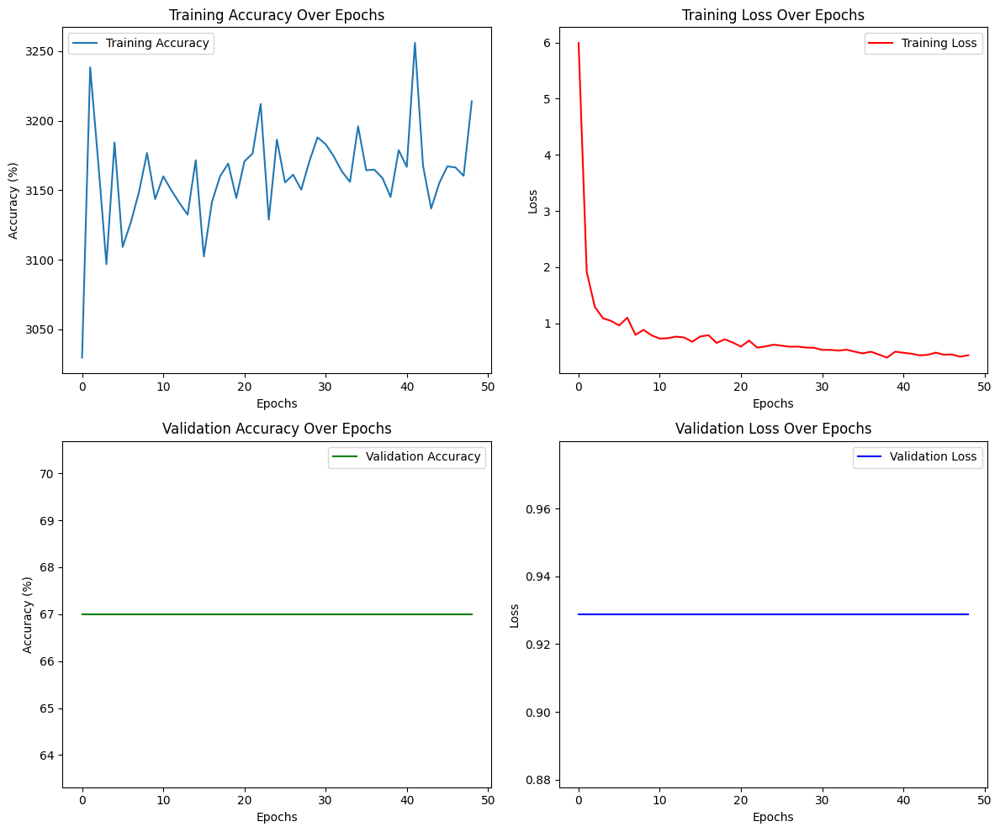

In [7]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 100
    train_subset_size = 500  # Increased subset size for training
    val_subset_size = 100    # Subset size for validation
    patience = 10            # Early stopping patience

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive

# Model training function with accuracy tracking and early stopping
def train_model(net, train_loader, criterion, optimizer, epochs, patience):
    train_accuracy_list = []
    train_loss_list = []
    best_loss = float('inf')
    trigger_times = 0

    for epoch in range(epochs):
        correct, total, epoch_loss = 0, 0, 0.0
        net.train()

        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.to(device), img1.to(device), label.to(device)
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()

            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 1.0).float()
            correct += (prediction == label).sum().item()
            total += label.size(0)
            epoch_loss += loss_contrastive.item()

        epoch_accuracy = (correct / total) * 100
        epoch_loss /= len(train_loader)
        train_accuracy_list.append(epoch_accuracy)
        train_loss_list.append(epoch_loss)

        print(f"Epoch {epoch + 1}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.2f}%")

        # Early stopping
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= patience:
                print("Early stopping triggered")
                break

    return train_accuracy_list, train_loss_list

# Validation function with accuracy and loss tracking
def validate_model(net, val_loader, criterion):
    val_accuracy_list = []
    val_loss_list = []

    correct, total, val_loss = 0, 0, 0.0
    net.eval()
    with torch.no_grad():
        for data in val_loader:
            x0, x1, label = data
            x0, x1, label = x0.to(device), x1.to(device), label.to(device)
            output1, output2 = net(x0, x1)

            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 1.0).float()
            correct += (prediction == label).sum().item()
            total += label.size(0)

            loss_contrastive = criterion(output1, output2, label)
            val_loss += loss_contrastive.item()

    accuracy = (correct / total) * 100
    val_loss /= len(val_loader)
    val_accuracy_list.append(accuracy)
    val_loss_list.append(val_loss)

    print(f'Validation Accuracy: {accuracy:.2f}%')
    return val_accuracy_list, val_loss_list

# Model training
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=0.0005)

train_accuracy_list, train_loss_list = train_model(net, train_dataloader, criterion, optimizer, Config.train_number_epochs, Config.patience)

# Validation with subset
siamese_dataset_val = load_dataset(Config.validation_dir, Config.val_subset_size)
val_dataloader = DataLoader(siamese_dataset_val, num_workers=4, batch_size=1, shuffle=True)

val_accuracy_list, val_loss_list = validate_model(net, val_dataloader, criterion)

# Plotting Accuracy and Loss over Epochs
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.plot(train_accuracy_list, label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training Accuracy Over Epochs')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(train_loss_list, label='Training Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(val_accuracy_list * len(train_accuracy_list), label='Validation Accuracy', color='green')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Validation Accuracy Over Epochs')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(val_loss_list * len(train_loss_list), label='Validation Loss', color='blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Loss Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

Epoch 1/100, Train Loss: 0.6251, Val Loss: 0.5900, Val Acc: 79.00%
Epoch 2/100, Train Loss: 0.7029, Val Loss: 0.7774, Val Acc: 71.00%
Epoch 3/100, Train Loss: 0.6386, Val Loss: 0.6572, Val Acc: 78.00%
Epoch 4/100, Train Loss: 0.6202, Val Loss: 0.8088, Val Acc: 72.00%
Epoch 5/100, Train Loss: 0.6219, Val Loss: 0.6051, Val Acc: 75.00%
Epoch 6/100, Train Loss: 0.5970, Val Loss: 0.6067, Val Acc: 80.00%
Epoch 7/100, Train Loss: 0.5873, Val Loss: 0.7852, Val Acc: 82.00%
Epoch 8/100, Train Loss: 0.5502, Val Loss: 0.6084, Val Acc: 76.00%
Epoch 9/100, Train Loss: 0.5094, Val Loss: 0.6823, Val Acc: 75.00%
Epoch 10/100, Train Loss: 0.4932, Val Loss: 0.6024, Val Acc: 79.00%
Epoch 11/100, Train Loss: 0.6050, Val Loss: 0.6917, Val Acc: 74.00%
Epoch 12/100, Train Loss: 0.5587, Val Loss: 0.9503, Val Acc: 69.00%
Epoch 13/100, Train Loss: 0.4743, Val Loss: 0.6956, Val Acc: 81.00%
Epoch 14/100, Train Loss: 0.4557, Val Loss: 0.6808, Val Acc: 75.00%
Epoch 15/100, Train Loss: 0.4638, Val Loss: 0.7600, Val A

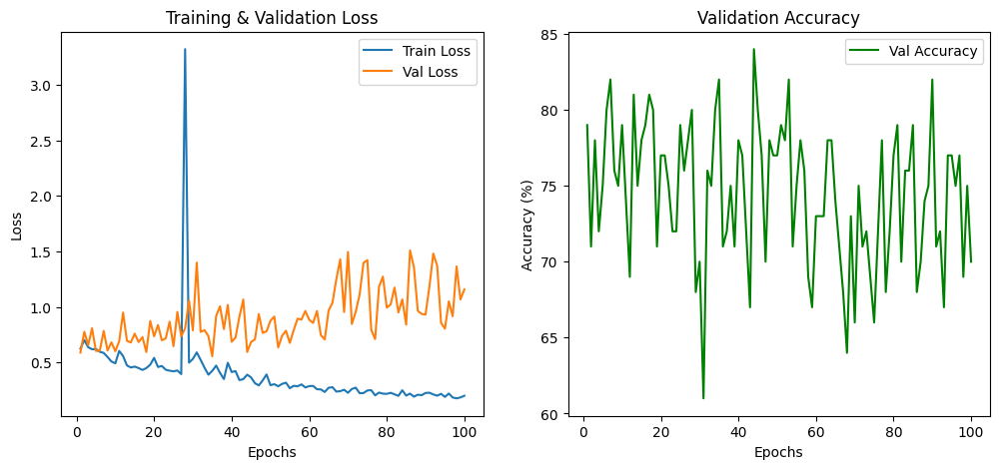

In [10]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 100
    train_subset_size = 500  # Increased subset size for training
    val_subset_size = 100    # Subset size for validation
    patience = 10            # Early stopping patience

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive
# Modify train_model to track losses
def train_model(net, train_loader, val_loader, criterion, optimizer, epochs):
    train_losses = []
    val_losses = []
    val_accuracies = []
    best_loss = float('inf')
    trigger_times = 0

    for epoch in range(epochs):
        net.train()
        epoch_loss = 0
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()
            epoch_loss += loss_contrastive.item()

        train_losses.append(epoch_loss / len(train_loader))
        val_loss, val_acc = validate_model(net, val_loader, criterion)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.2f}%")
        # Early stopping
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= Config.patience:
                print("Early stopping triggered")
                break
    plot_metrics(train_losses, val_losses, val_accuracies)

# Modify validate_model to return loss and accuracy
def validate_model(net, val_loader, criterion):
    net.eval()
    val_loss = 0
    correct, total = 0, 0

    with torch.no_grad():
        for data in val_loader:
            x0, x1, label = data
            x0, x1, label = x0.cuda(), x1.cuda(), label.cuda()
            output1, output2 = net(x0, x1)
            loss_contrastive = criterion(output1, output2, label)
            val_loss += loss_contrastive.item()

            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 1.0).float()
            correct += (prediction.cpu() == label.cpu()).sum().item()
            total += label.size(0)

    accuracy = (correct / total) * 100
    return val_loss / len(val_loader), accuracy

# Function to plot training and validation metrics
def plot_metrics(train_losses, val_losses, val_accuracies):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training & Validation Loss")
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, val_accuracies, label="Val Accuracy", color="green")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy (%)")
    plt.title("Validation Accuracy")
    plt.legend()

    plt.show()

# Train and validate model
train_model(net, train_dataloader, val_dataloader, criterion, optimizer, Config.train_number_epochs)


# Increased subset size for training and validation (1000 - 200)

Epoch 1/100, Train Loss: 0.7934, Val Loss: 0.7984, Val Acc: 68.00%
Epoch 2/100, Train Loss: 0.7870, Val Loss: 0.6304, Val Acc: 76.00%
Epoch 3/100, Train Loss: 0.7637, Val Loss: 0.7798, Val Acc: 72.00%
Epoch 4/100, Train Loss: 0.7271, Val Loss: 0.7184, Val Acc: 73.00%
Epoch 5/100, Train Loss: 0.7017, Val Loss: 0.6402, Val Acc: 75.00%
Epoch 6/100, Train Loss: 0.7467, Val Loss: 0.7950, Val Acc: 75.00%
Epoch 7/100, Train Loss: 0.7536, Val Loss: 0.8250, Val Acc: 72.00%
Epoch 8/100, Train Loss: 0.7078, Val Loss: 0.7276, Val Acc: 75.00%
Epoch 9/100, Train Loss: 0.6913, Val Loss: 0.7157, Val Acc: 66.00%
Epoch 10/100, Train Loss: 0.7320, Val Loss: 0.7433, Val Acc: 71.00%
Epoch 11/100, Train Loss: 0.6748, Val Loss: 0.8434, Val Acc: 73.00%
Epoch 12/100, Train Loss: 0.6359, Val Loss: 0.7760, Val Acc: 75.00%
Epoch 13/100, Train Loss: 0.6382, Val Loss: 0.6194, Val Acc: 74.00%
Epoch 14/100, Train Loss: 0.7113, Val Loss: 0.7091, Val Acc: 77.00%
Epoch 15/100, Train Loss: 0.6197, Val Loss: 0.5535, Val A

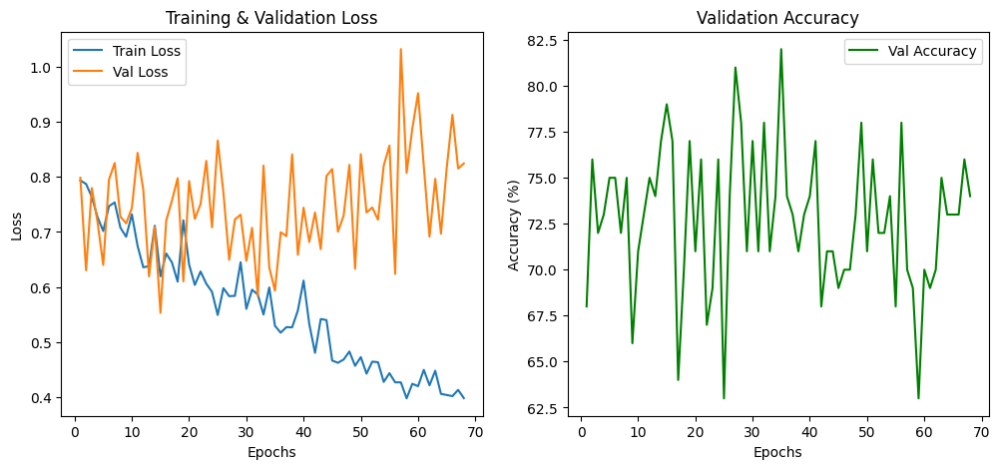

In [9]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 100
    train_subset_size = 1000  # Increased subset size for training
    val_subset_size = 200    # Subset size for validation
    patience = 10            # Early stopping patience

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive
# Modify train_model to track losses
def train_model(net, train_loader, val_loader, criterion, optimizer, epochs):
    train_losses = []
    val_losses = []
    val_accuracies = []
    best_loss = float('inf')
    trigger_times = 0

    for epoch in range(epochs):
        net.train()
        epoch_loss = 0
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()
            epoch_loss += loss_contrastive.item()

        train_losses.append(epoch_loss / len(train_loader))
        val_loss, val_acc = validate_model(net, val_loader, criterion)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.2f}%")
        # Early stopping
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= Config.patience:
                print("Early stopping triggered")
                break
    plot_metrics(train_losses, val_losses, val_accuracies)

# Modify validate_model to return loss and accuracy
def validate_model(net, val_loader, criterion):
    net.eval()
    val_loss = 0
    correct, total = 0, 0

    with torch.no_grad():
        for data in val_loader:
            x0, x1, label = data
            x0, x1, label = x0.cuda(), x1.cuda(), label.cuda()
            output1, output2 = net(x0, x1)
            loss_contrastive = criterion(output1, output2, label)
            val_loss += loss_contrastive.item()

            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 1.0).float()
            correct += (prediction.cpu() == label.cpu()).sum().item()
            total += label.size(0)

    accuracy = (correct / total) * 100
    return val_loss / len(val_loader), accuracy

# Function to plot training and validation metrics
def plot_metrics(train_losses, val_losses, val_accuracies):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training & Validation Loss")
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, val_accuracies, label="Val Accuracy", color="green")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy (%)")
    plt.title("Validation Accuracy")
    plt.legend()

    plt.show()

# Train and validate model
train_model(net, train_dataloader, val_dataloader, criterion, optimizer, Config.train_number_epochs)


# Increased subset size for training and validation (2000 - 500)

Epoch 1/100, Train Loss: 0.9700, Val Loss: 0.6694, Val Acc: 74.00%
Epoch 2/100, Train Loss: 0.8561, Val Loss: 0.7505, Val Acc: 66.00%
Epoch 3/100, Train Loss: 0.8229, Val Loss: 0.7143, Val Acc: 74.00%
Epoch 4/100, Train Loss: 0.7690, Val Loss: 0.6647, Val Acc: 77.00%
Epoch 5/100, Train Loss: 0.7860, Val Loss: 0.6222, Val Acc: 70.00%
Epoch 6/100, Train Loss: 0.7929, Val Loss: 0.6121, Val Acc: 74.00%
Epoch 7/100, Train Loss: 0.7622, Val Loss: 0.6426, Val Acc: 79.00%
Epoch 8/100, Train Loss: 0.7575, Val Loss: 0.7060, Val Acc: 70.00%
Epoch 9/100, Train Loss: 0.7361, Val Loss: 0.7523, Val Acc: 70.00%
Epoch 10/100, Train Loss: 0.7440, Val Loss: 0.6603, Val Acc: 74.00%
Epoch 11/100, Train Loss: 0.7363, Val Loss: 0.5269, Val Acc: 85.00%
Epoch 12/100, Train Loss: 0.7206, Val Loss: 0.6461, Val Acc: 77.00%
Epoch 13/100, Train Loss: 0.7090, Val Loss: 0.7049, Val Acc: 72.00%
Epoch 14/100, Train Loss: 0.7507, Val Loss: 0.6924, Val Acc: 71.00%
Epoch 15/100, Train Loss: 0.7266, Val Loss: 0.7190, Val A

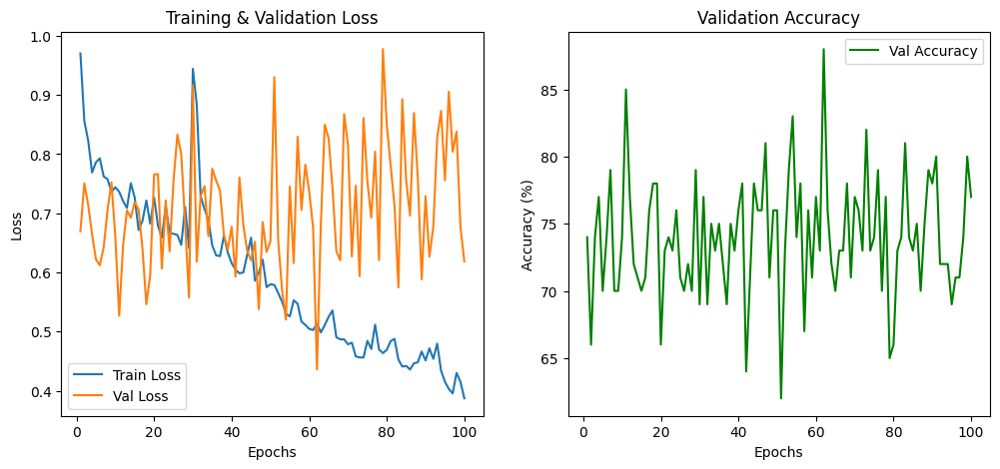

In [11]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 100
    train_subset_size = 2000  # Increased subset size for training
    val_subset_size = 500    # Subset size for validation
    patience = 10            # Early stopping patience

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive
# Modify train_model to track losses
def train_model(net, train_loader, val_loader, criterion, optimizer, epochs):
    train_losses = []
    val_losses = []
    val_accuracies = []
    best_loss = float('inf')
    trigger_times = 0

    for epoch in range(epochs):
        net.train()
        epoch_loss = 0
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()
            epoch_loss += loss_contrastive.item()

        train_losses.append(epoch_loss / len(train_loader))
        val_loss, val_acc = validate_model(net, val_loader, criterion)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.2f}%")
        # Early stopping
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= Config.patience:
                print("Early stopping triggered")
                break
    plot_metrics(train_losses, val_losses, val_accuracies)

# Modify validate_model to return loss and accuracy
def validate_model(net, val_loader, criterion):
    net.eval()
    val_loss = 0
    correct, total = 0, 0

    with torch.no_grad():
        for data in val_loader:
            x0, x1, label = data
            x0, x1, label = x0.cuda(), x1.cuda(), label.cuda()
            output1, output2 = net(x0, x1)
            loss_contrastive = criterion(output1, output2, label)
            val_loss += loss_contrastive.item()

            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 1.0).float()
            correct += (prediction.cpu() == label.cpu()).sum().item()
            total += label.size(0)

    accuracy = (correct / total) * 100
    return val_loss / len(val_loader), accuracy

# Function to plot training and validation metrics
def plot_metrics(train_losses, val_losses, val_accuracies):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training & Validation Loss")
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, val_accuracies, label="Val Accuracy", color="green")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy (%)")
    plt.title("Validation Accuracy")
    plt.legend()

    plt.show()

# Train and validate model
train_model(net, train_dataloader, val_dataloader, criterion, optimizer, Config.train_number_epochs)


Epoch 1/100, Train Loss: 0.6236, Val Loss: 0.5787, Val Acc: 80.00%
Epoch 2/100, Train Loss: 0.5414, Val Loss: 0.6719, Val Acc: 76.00%
Epoch 3/100, Train Loss: 0.5355, Val Loss: 0.7609, Val Acc: 70.00%
Epoch 4/100, Train Loss: 0.5832, Val Loss: 0.7385, Val Acc: 72.00%
Epoch 5/100, Train Loss: 0.5729, Val Loss: 0.6477, Val Acc: 77.00%
Epoch 6/100, Train Loss: 0.5399, Val Loss: 0.6940, Val Acc: 76.00%
Epoch 7/100, Train Loss: 0.5274, Val Loss: 0.5994, Val Acc: 79.00%
Epoch 8/100, Train Loss: 0.5548, Val Loss: 0.7061, Val Acc: 74.00%
Epoch 9/100, Train Loss: 0.5470, Val Loss: 0.5319, Val Acc: 81.00%
Epoch 10/100, Train Loss: 0.4445, Val Loss: 0.7376, Val Acc: 79.00%
Epoch 11/100, Train Loss: 0.3956, Val Loss: 0.7080, Val Acc: 71.00%
Epoch 12/100, Train Loss: 0.4122, Val Loss: 0.8497, Val Acc: 71.00%
Epoch 13/100, Train Loss: 0.4274, Val Loss: 0.8664, Val Acc: 69.00%
Epoch 14/100, Train Loss: 0.4271, Val Loss: 0.8971, Val Acc: 69.00%
Epoch 15/100, Train Loss: 0.4560, Val Loss: 0.6894, Val A

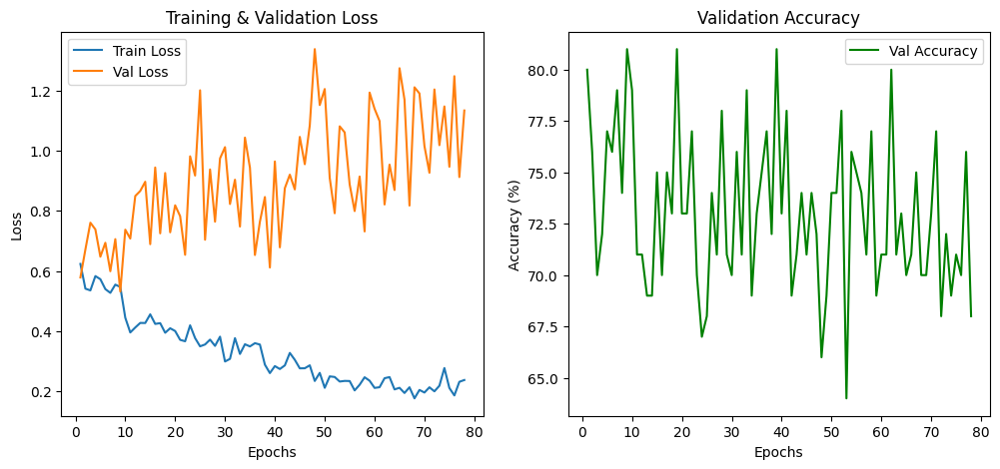

In [12]:
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import random
import os
from PIL import Image
import numpy as np
import torch
import PIL.ImageOps
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Config class with dataset paths
class Config:
    base_dir = "/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1"
    training_dir = os.path.join(base_dir, "train")
    validation_dir = os.path.join(base_dir, "val")
    train_batch_size = 64
    train_number_epochs = 100
    train_subset_size = 500  # Increased subset size for training
    val_subset_size = 100    # Subset size for validation
    patience = 10            # Early stopping patience

# Data augmentation and preprocessing
transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

# Dataset class
class SiameseNetworkDataset(Dataset):
    def __init__(self, image_paths, transform=None, should_invert=True):
        self.image_paths = image_paths
        self.transform = transform
        self.should_invert = should_invert

    def __getitem__(self, index):
        img0_path, img0_label = random.choice(self.image_paths)
        should_get_same_class = random.randint(0, 1)

        if should_get_same_class:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] == img0_label])
        else:
            img1_path, img1_label = random.choice([img for img in self.image_paths if img[1] != img0_label])

        img0 = Image.open(img0_path).convert("L")
        img1 = Image.open(img1_path).convert("L")

        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_label != img0_label)], dtype=np.float32))

    def __len__(self):
        return len(self.image_paths)

# Load dataset and create subsets
def load_dataset(directory, subset_size):
    folder_dataset = dset.ImageFolder(root=directory)
    subset_indices = random.sample(range(len(folder_dataset.imgs)), subset_size)
    subset_paths = [folder_dataset.imgs[i] for i in subset_indices]
    return SiameseNetworkDataset(image_paths=subset_paths, transform=transform, should_invert=False)

siamese_dataset_train = load_dataset(Config.training_dir, Config.train_subset_size)
train_dataloader = DataLoader(siamese_dataset_train, shuffle=True, num_workers=4, batch_size=Config.train_batch_size)

# Define Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1), nn.Conv2d(1, 4, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(4),
            nn.ReflectionPad2d(1), nn.Conv2d(4, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8),
            nn.ReflectionPad2d(1), nn.Conv2d(8, 8, kernel_size=3), nn.ReLU(inplace=True), nn.BatchNorm2d(8)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(8 * 100 * 100, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 500), nn.ReLU(inplace=True),
            nn.Linear(500, 128)  # Embedding dimension
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

# Contrastive Loss
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim=True)
        loss_contrastive = torch.mean(
            (1 - label) * torch.pow(euclidean_distance, 2) +
            label * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss_contrastive
# Modify train_model to track losses
def train_model(net, train_loader, val_loader, criterion, optimizer, epochs):
    train_losses = []
    val_losses = []
    val_accuracies = []
    best_loss = float('inf')
    trigger_times = 0

    for epoch in range(epochs):
        net.train()
        epoch_loss = 0
        for i, data in enumerate(train_loader, 0):
            img0, img1, label = data
            img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
            optimizer.zero_grad()
            output1, output2 = net(img0, img1)
            loss_contrastive = criterion(output1, output2, label)
            loss_contrastive.backward()
            optimizer.step()
            epoch_loss += loss_contrastive.item()

        train_losses.append(epoch_loss / len(train_loader))
        val_loss, val_acc = validate_model(net, val_loader, criterion)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.2f}%")
        # Early stopping
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= Config.patience:
                print("Early stopping triggered")
                break
    plot_metrics(train_losses, val_losses, val_accuracies)

# Modify validate_model to return loss and accuracy
def validate_model(net, val_loader, criterion):
    net.eval()
    val_loss = 0
    correct, total = 0, 0

    with torch.no_grad():
        for data in val_loader:
            x0, x1, label = data
            x0, x1, label = x0.cuda(), x1.cuda(), label.cuda()
            output1, output2 = net(x0, x1)
            loss_contrastive = criterion(output1, output2, label)
            val_loss += loss_contrastive.item()

            euclidean_distance = F.pairwise_distance(output1, output2)
            prediction = (euclidean_distance > 1.0).float()
            correct += (prediction.cpu() == label.cpu()).sum().item()
            total += label.size(0)

    accuracy = (correct / total) * 100
    return val_loss / len(val_loader), accuracy

# Function to plot training and validation metrics
def plot_metrics(train_losses, val_losses, val_accuracies):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training & Validation Loss")
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, val_accuracies, label="Val Accuracy", color="green")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy (%)")
    plt.title("Validation Accuracy")
    plt.legend()

    plt.show()

# Train and validate model
train_model(net, train_dataloader, val_dataloader, criterion, optimizer, Config.train_number_epochs)


In [ ]:
torch.save(net.state_dict(), "siamese_model.pth")


In [ ]:
from google.colab import files
files.download('siamese_model.pth')